# 나만의 이미지 분류기 만들어보기

# 1. 데이터셋 내려받기 

In [1]:
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
print(tf.__version__)

2.6.0


In [2]:
import tensorflow_datasets as tfds

In [3]:
!mkdir -p ~/aiffel/flowers/FlowerImages
!ln -s ~/data/* ~/aiffel/flowers/

ln: failed to create symbolic link '/aiffel/aiffel/flowers/cat_face.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/flowers/cats_vs_dogs': File exists
ln: failed to create symbolic link '/aiffel/aiffel/flowers/my_cat.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/flowers/my_dog.jpg': File exists


In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/flowers/FlowerImages',
    download=True,
    with_info=True,
    as_supervised=True,
)

- 그냥 받으면 에러가 나고, download 설정을 True로 설정해야 한다

In [5]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


# 2. 데이터 가공

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

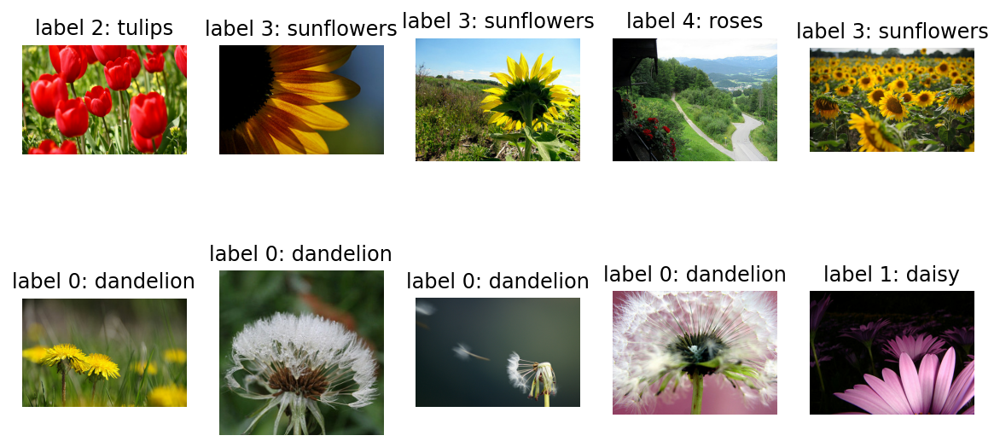

In [7]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

- label = {'dandelion':0, 'daisy':1, 'tulips':2, 'sunflowers':3, 'roses':4}

In [8]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

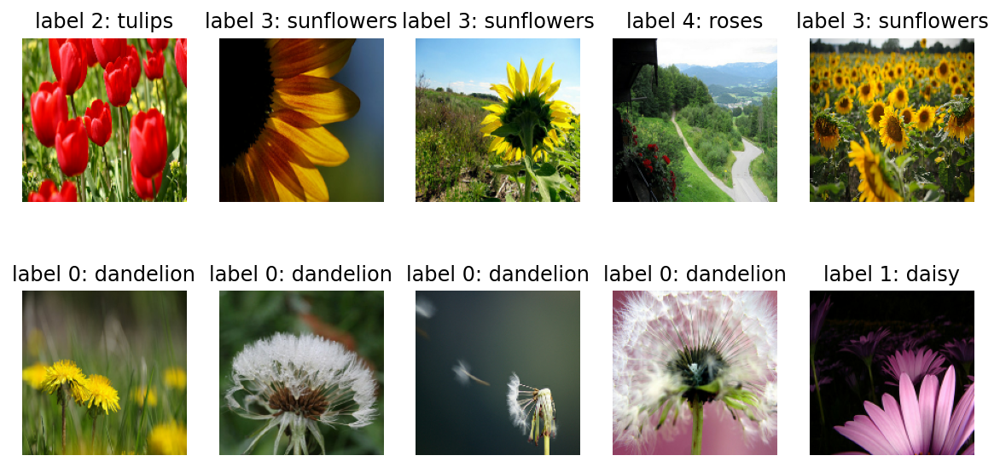

In [9]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 3. 모델 설계하기

In [10]:
# 모델생성에 필요한 함수

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=256, activation='relu'),
    Dense(units=5, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

- 꽃 카테고리가 5개이므로, 마지막 output layer의 dense unit을 5개로 설정해주었다.

In [11]:
import numpy as np

learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [12]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [13]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [14]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 1.6250 - accuracy: 0.1744WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 3s 21ms/step - loss: 1.6250 - accuracy: 0.1744
initial loss: 1.63
initial accuracy: 0.17


# 4. 모델 학습시키기

- initial accuracy가 0.17 밖에 안된다.

In [15]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 6s 38ms/step - loss: 1.2961 - accuracy: 0.4380 - val_loss: 1.1413 - val_accuracy: 0.5204
Epoch 2/10
92/92 [==============================] - 3s 26ms/step - loss: 1.0514 - accuracy: 0.5722 - val_loss: 1.0186 - val_accuracy: 0.6185
Epoch 3/10
92/92 [==============================] - 3s 26ms/step - loss: 0.9371 - accuracy: 0.6444 - val_loss: 1.0263 - val_accuracy: 0.5858
Epoch 4/10
92/92 [==============================] - 3s 26ms/step - loss: 0.8448 - accuracy: 0.6860 - val_loss: 0.9745 - val_accuracy: 0.6104
Epoch 5/10
92/92 [==============================] - 3s 26ms/step - loss: 0.7542 - accuracy: 0.7241 - val_loss: 1.1237 - val_accuracy: 0.5586
Epoch 6/10
92/92 [==============================] - 3s 26ms/step - loss: 0.6804 - accuracy: 0.7490 - val_loss: 1.0254 - val_accuracy: 0.5749
Epoch 7/10
92/92 [==============================] - 3s 25ms/step - loss: 0.6083 - accuracy: 0.7841 - val_loss: 0.8950 - val_accuracy: 0.6431
Epoch 8/10
92

- train data accuracy는 85%까지 올라오는데, validation accuracy는 63% 수준이다

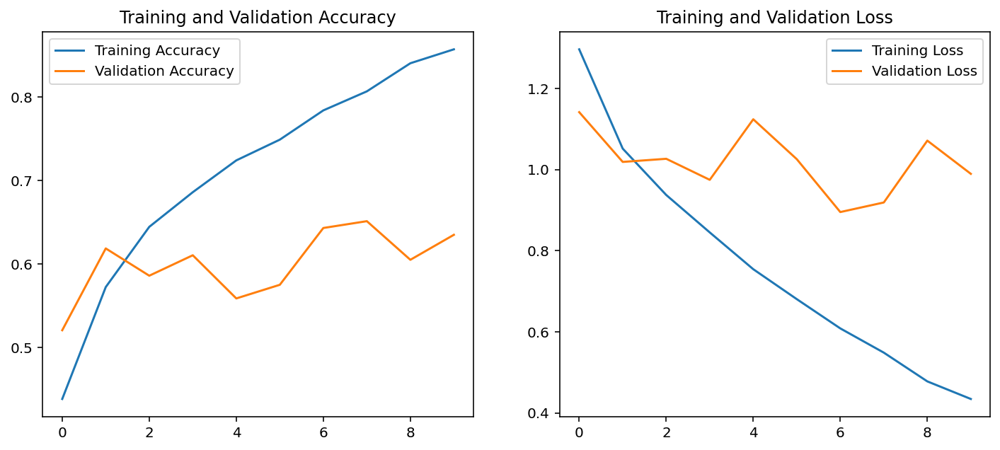

In [16]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

* accuracy는 train 할수록 올라가고, loss는 내려가고 있다

In [17]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[2.8170992e-02, 7.1170130e-03, 4.1115153e-01, 2.3096101e-01,
        3.2259947e-01],
       [9.2996788e-01, 6.4433612e-02, 1.6568259e-03, 3.9906809e-05,
        3.9017559e-03],
       [6.9512457e-01, 1.9505259e-02, 9.3918115e-02, 1.8396088e-01,
        7.4911495e-03],
       [7.5454392e-02, 4.2837521e-01, 2.2109170e-01, 5.5063143e-03,
        2.6957238e-01],
       [7.9984081e-01, 2.4943983e-02, 1.7464686e-02, 8.9963600e-03,
        1.4875416e-01],
       [4.9170822e-01, 5.1047236e-02, 8.9840516e-02, 9.1274884e-03,
        3.5827658e-01],
       [3.4669924e-03, 1.9567202e-01, 4.9397787e-01, 1.6521031e-02,
        2.9036206e-01],
       [9.7460985e-02, 1.4241865e-01, 9.1549002e-02, 3.1237533e-02,
        6.3733381e-01],
       [1.7923282e-02, 8.9733476e-05, 5.3074928e-03, 9.7606295e-01,
        6.1662367e-04],
       [9.6493942e-01, 1.9540181e-02, 6.0443213e-04, 1.5857370e-04,
        1.4757420e-02],
       [9.8820519e-01, 4.9006324e-03, 1.4921003e-03, 1.8048914e-04,
        5.22

In [18]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 1, 0, 0, 2, 4, 3, 0, 0, 3, 3, 4, 0, 3, 4, 3, 0, 4, 2, 0,
       1, 0, 1, 0, 4, 4, 2, 1, 0, 0])

- 배열에서 가장 큰 인덱스 값을 반환하는 함수 argmax를 적용해서, 모델이 예측한 값의 인덱스만 뽑아낸다

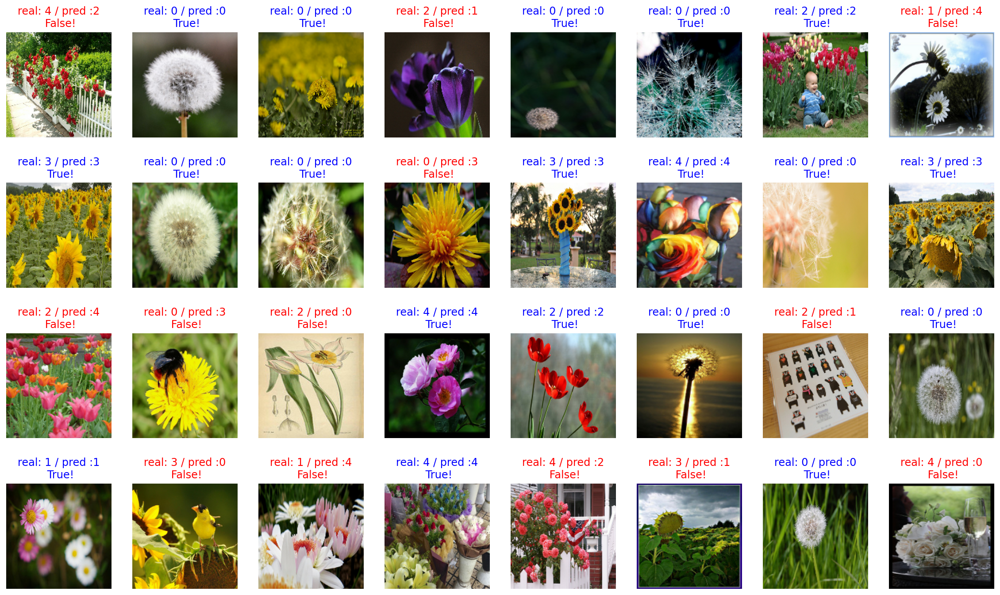

In [19]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [20]:
count = 0 
for image, label, prediction in zip(images, labels, predictions):
    correct = label==prediction
    if correct:
        count = count+1
print(count/ 32*100)

59.375


# 5. 모델 성능 향상시키기
- 기존에 만들었던 모델이 Batch Normalization 적용 및 파라미터를 변경해본다 (epoch 10->15)

In [21]:
from tensorflow.keras.layers import BatchNormalization, Activation

In [22]:
#모델에 Batch normalization, Dropout 추가하기
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', input_shape=(160, 160, 3)),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D(),
    
    Conv2D(filters=32, kernel_size=3, padding='same'),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D(),
    
    Conv2D(filters=64, kernel_size=3, padding='same'),
    BatchNormalization(),
    Activation('relu'),    
    MaxPooling2D(),
    
    Flatten(),
    Dense(units=256, activation='relu'),
    Dense(units=5, activation='softmax')
])

model.summary()

#learning rate 변경
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

#epoch 수 변경
EPOCHS = 15
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 160, 160, 16)      448       
_________________________________________________________________
batch_normalization (BatchNo (None, 160, 160, 16)      64        
_________________________________________________________________
activation (Activation)      (None, 160, 160, 16)      0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
batch_normalization_1 (Batch (None, 80, 80, 32)        128       
_________________________________________________________________
activation_1 (Activation)    (None, 80, 80, 32)       

- 기존 train accuracy, validation accuracy가 85%, 63%에서  96%, 69% 까지 올라왔다.

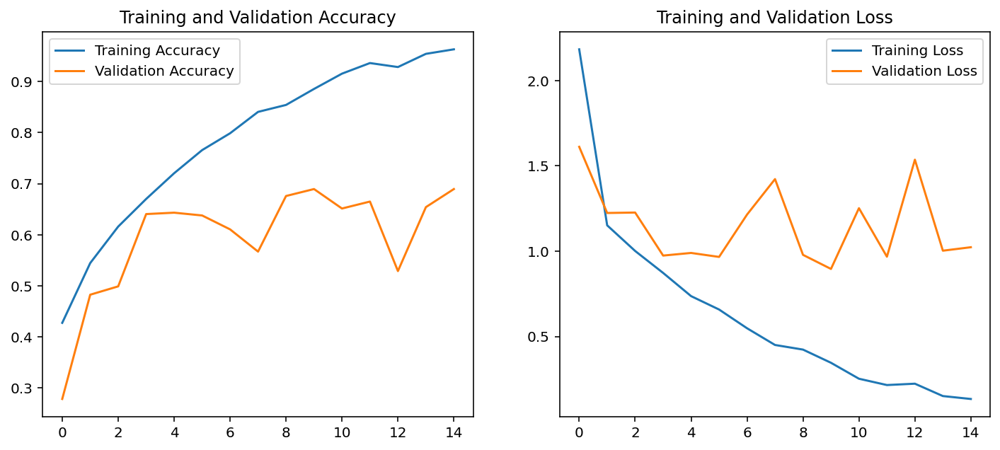

In [23]:
#결과 확인 
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# 6. Base model로 VGG16 사용

In [24]:
#VGG16 호출 

IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [25]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

* 이 원본 이미지 데이터의 차원을 줄여주기 위해 1차원 벡터로 변환하는 GAP 사용

In [26]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [27]:
#GAP 만드는 레이어 추가
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [28]:
# dense layer 추가

dense_layer = tf.keras.layers.Dense(
    512,
    activation='relu',
    use_bias=True,
    kernel_initializer='glorot_uniform',
    bias_initializer='zeros'
)

# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer = tf.keras.layers.Dense(
    5,
    activation='softmax',
    use_bias=True,
    kernel_initializer='glorot_uniform',
    bias_initializer='zeros'
)

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [29]:
#VGG16에 해당하는 base_model은 학습을 시키지 않을 예정이니 학습 여부를 결정하는 trainable 변수를 False로 지정해 "꺼주겠"습니다.
base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [30]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_5 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [41]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

EPOCHS = 10
history = model.fit(train_batches, epochs=EPOCHS, validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 8s 78ms/step - loss: 0.6580 - accuracy: 0.7895 - val_loss: 0.6425 - val_accuracy: 0.7738
Epoch 2/10
92/92 [==============================] - 7s 75ms/step - loss: 0.6181 - accuracy: 0.8021 - val_loss: 0.6202 - val_accuracy: 0.7793
Epoch 3/10
92/92 [==============================] - 7s 76ms/step - loss: 0.5873 - accuracy: 0.8137 - val_loss: 0.5908 - val_accuracy: 0.7956
Epoch 4/10
92/92 [==============================] - 7s 77ms/step - loss: 0.5641 - accuracy: 0.8198 - val_loss: 0.5746 - val_accuracy: 0.7875
Epoch 5/10
92/92 [==============================] - 8s 78ms/step - loss: 0.5412 - accuracy: 0.8266 - val_loss: 0.5585 - val_accuracy: 0.8038
Epoch 6/10
92/92 [==============================] - 8s 78ms/step - loss: 0.5231 - accuracy: 0.8338 - val_loss: 0.5489 - val_accuracy: 0.8120
Epoch 7/10
92/92 [==============================] - 8s 78ms/step - loss: 0.5069 - accuracy: 0.8396 - val_loss: 0.5527 - val_accuracy: 0.8038
Epoch 8/10
92

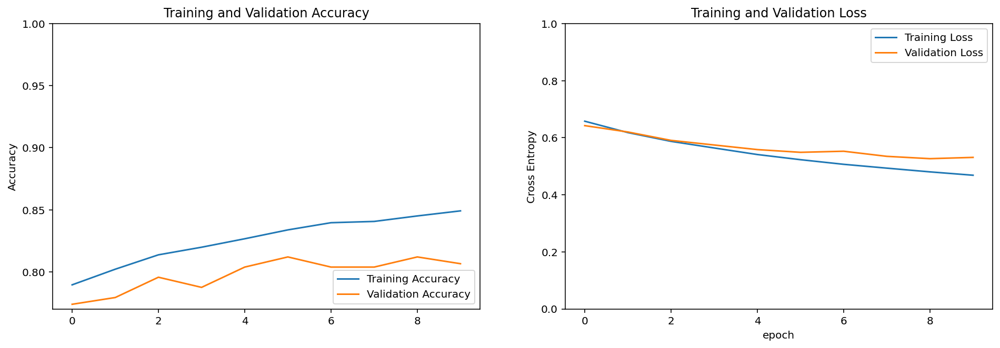

In [42]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [43]:
#test data로 예측을 진행해본다

for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.53936986e-02, 5.51065095e-02, 6.99896932e-01, 3.90085392e-02,
        1.90594301e-01],
       [9.98859167e-01, 9.08386719e-04, 1.16126484e-05, 6.05932219e-05,
        1.60254625e-04],
       [6.77271545e-01, 1.40543625e-01, 2.21263133e-02, 1.20991997e-01,
        3.90665904e-02],
       [1.45448197e-03, 8.50090943e-03, 4.54828203e-01, 6.41350169e-03,
        5.28802931e-01],
       [6.13534451e-01, 3.12824845e-01, 1.68507695e-02, 1.46220354e-02,
        4.21678536e-02],
       [9.18705285e-01, 4.79629934e-02, 4.04344453e-03, 2.68236827e-02,
        2.46459129e-03],
       [8.17251671e-03, 1.78755037e-02, 7.03446925e-01, 1.77689254e-01,
        9.28158388e-02],
       [4.20369834e-01, 4.40704793e-01, 1.59644056e-03, 1.29832298e-01,
        7.49657024e-03],
       [6.31819107e-03, 1.20415853e-03, 1.60483960e-02, 8.59064162e-01,
        1.17365070e-01],
       [9.99157429e-01, 7.65466306e-04, 2.04567687e-06, 6.70867739e-05,
        7.99571626e-06],
       [9.68376398e-01, 2.4147

In [44]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 4, 0, 0, 2, 1, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 3, 2, 4, 4, 3, 0, 4])

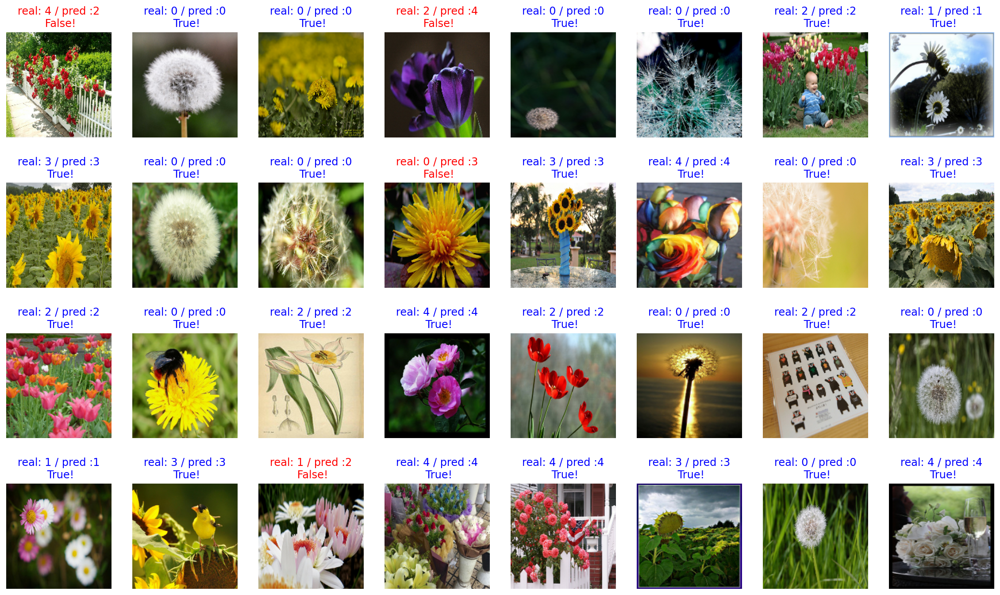

In [45]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [46]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

87.5


- test data에 대한 정확도가 87.5%가 나왔다!

In [37]:
!mkdir -p ~/aiffel/flowers/checkpoint
!mkdir -p ~/aiffel/flowers/images

In [38]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/flowers/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


---

# 💡 회고
- Test data에 대한 예측이 87.5% 수준으로 양호하게 나왔다. 
- transfer learning을 잘 쓰기만 해도, 직접 모델을 트레이닝하는데 드는 시간과 에너지가 많이 단축되겠다는 생각을 했다. 모델의 구조를 이해하기 위해 직접 짜보는 과정이 유익했지만, 어떤 모델을 가져다와서 쓰고 어디까지 freeze하고 어디까지 다시 학습시킬 것인지를 판별하는 능력이 실무에서는 더 잘 쓰일 거 같다는 생각이 든다.
- 전반적으로 이미지 예측하는 컴퓨터 비전은 매우 흥미로웠다. 크게 관심을 두지 않았던 분야이고, '그거는 컴퓨터 공학과 나온 애들이 전문적으로 하는 거 아니야?'라는 생각을 무의식중에 갖고 있었는데, 막상 해보니 코드만 보이다가 그림이 간간히 보이는 게 재미있기도 하고, 조금씩 에러를 낮춰가는 과정도 흥미롭다. 어떻게 하면 더 효율적인 optimizer를 개발할 수 있을 것인가에 대한 연구가 계속 진행되는 것으로 알고 있는데, 역시 진짜 기술을 발전시키는 공학에 대한 흥미도 높아진다. 여러모로 유익한 챕터였고, calculus 공부도 끝마친 김에 이 분야쪽에 더 큰 관심이 생겨서 따로 공부해 봐야겠다.